In [1]:
import  pandas as pd

In [2]:
%matplotlib inline

In [3]:
training_file_path = "Training.csv"
test_file_path = "Testing.csv"

In [4]:
import pandas as pd

sym_des = pd.read_csv("symtoms_df.csv")
precautions = pd.read_csv("precautions_df.csv")
workout = pd.read_csv("workout_df.csv")
medications = pd.read_csv("medications.csv")
description = pd.read_csv("description.csv")
diets = pd.read_csv("diets.csv")


In [5]:
# Load the datasets
train_df = pd.read_csv(training_file_path)
test_df = pd.read_csv(test_file_path)

# Add a column to distinguish between train and test data
# train_df['source'] = 'train'
# test_df['source'] = 'test'

# Combine into a single DataFrame
dataset = pd.concat([train_df, test_df], ignore_index=True)

# Display the combined DataFrame
print(dataset.head())
print(f"Total rows in combined DataFrame: {len(dataset)}")

   itching  skin_rash  nodal_skin_eruptions  continuous_sneezing  shivering  \
0        1          1                     1                    0          0   
1        0          1                     1                    0          0   
2        1          0                     1                    0          0   
3        1          1                     0                    0          0   
4        1          1                     1                    0          0   

   chills  joint_pain  stomach_pain  acidity  ulcers_on_tongue  ...  \
0       0           0             0        0                 0  ...   
1       0           0             0        0                 0  ...   
2       0           0             0        0                 0  ...   
3       0           0             0        0                 0  ...   
4       0           0             0        0                 0  ...   

   blackheads  scurring  skin_peeling  silver_like_dusting  \
0           0         0             

In [6]:
len(dataset['prognosis']. unique())

41

In [7]:
dataset['prognosis']. unique()

array(['Fungal infection', 'Allergy', 'GERD', 'Chronic cholestasis',
       'Drug Reaction', 'Peptic ulcer diseae', 'AIDS', 'Diabetes ',
       'Gastroenteritis', 'Bronchial Asthma', 'Hypertension ', 'Migraine',
       'Cervical spondylosis', 'Paralysis (brain hemorrhage)', 'Jaundice',
       'Malaria', 'Chicken pox', 'Dengue', 'Typhoid', 'hepatitis A',
       'Hepatitis B', 'Hepatitis C', 'Hepatitis D', 'Hepatitis E',
       'Alcoholic hepatitis', 'Tuberculosis', 'Common Cold', 'Pneumonia',
       'Dimorphic hemmorhoids(piles)', 'Heart attack', 'Varicose veins',
       'Hypothyroidism', 'Hyperthyroidism', 'Hypoglycemia',
       'Osteoarthristis', 'Arthritis',
       '(vertigo) Paroymsal  Positional Vertigo', 'Acne',
       'Urinary tract infection', 'Psoriasis', 'Impetigo'], dtype=object)

In [8]:
print(list(dataset.columns))


['itching', 'skin_rash', 'nodal_skin_eruptions', 'continuous_sneezing', 'shivering', 'chills', 'joint_pain', 'stomach_pain', 'acidity', 'ulcers_on_tongue', 'muscle_wasting', 'vomiting', 'burning_micturition', 'spotting_ urination', 'fatigue', 'weight_gain', 'anxiety', 'cold_hands_and_feets', 'mood_swings', 'weight_loss', 'restlessness', 'lethargy', 'patches_in_throat', 'irregular_sugar_level', 'cough', 'high_fever', 'sunken_eyes', 'breathlessness', 'sweating', 'dehydration', 'indigestion', 'headache', 'yellowish_skin', 'dark_urine', 'nausea', 'loss_of_appetite', 'pain_behind_the_eyes', 'back_pain', 'constipation', 'abdominal_pain', 'diarrhoea', 'mild_fever', 'yellow_urine', 'yellowing_of_eyes', 'acute_liver_failure', 'fluid_overload', 'swelling_of_stomach', 'swelled_lymph_nodes', 'malaise', 'blurred_and_distorted_vision', 'phlegm', 'throat_irritation', 'redness_of_eyes', 'sinus_pressure', 'runny_nose', 'congestion', 'chest_pain', 'weakness_in_limbs', 'fast_heart_rate', 'pain_during_bow

In [9]:
# get num missing values per column
missing_vals = dataset.isna().sum()
# show only for columns where some values are missing
missing_vals[missing_vals.gt(0)]

Series([], dtype: int64)

In [10]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import pickle

In [11]:
X = dataset.drop('prognosis', axis=1)
y = dataset['prognosis']

# ecoding prognonsis
le = LabelEncoder()
le.fit(y)
Y = le.transform(y)
    
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.4, random_state=42)

In [12]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2977, 132), (1985, 132), (2977,), (1985,))

In [13]:
import matplotlib.pyplot as plt 
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
import numpy as np
import pickle

In [14]:
# Create a dictionary to store models
models = {
    'SVC': SVC(kernel='rbf', gamma='scale', random_state=42),
    'RandomForest': RandomForestClassifier(n_estimators=80, random_state=42),
    'GradientBoosting': GradientBoostingClassifier(n_estimators=80, random_state=42),
    'KNeighbors': KNeighborsClassifier(n_neighbors=150),
    'MultinomialNB': MultinomialNB(),
    'XGBClassifier': XGBClassifier(),
    'DecisionTree': DecisionTreeClassifier(criterion='entropy', max_depth=3),
    'LGBMClassifier': LGBMClassifier(),
    'LRegression': LogisticRegression(max_iter=100)
}

d:\ML\Comprehensive Health Diagnostics\Comprehensive-Health-Diagnostics\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
d:\ML\Comprehensive Health Diagnostics\Comprehensive-Health-Diagnostics\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=2).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
d:\ML\Comprehensive Health Diagnostics\Comprehensive-Health-Diagnostics\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=3).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
d:\ML\Comprehensive Health Diagnostics\Comprehensive-Health-Diagnostics\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=4).  Consider pre-processing your data wi

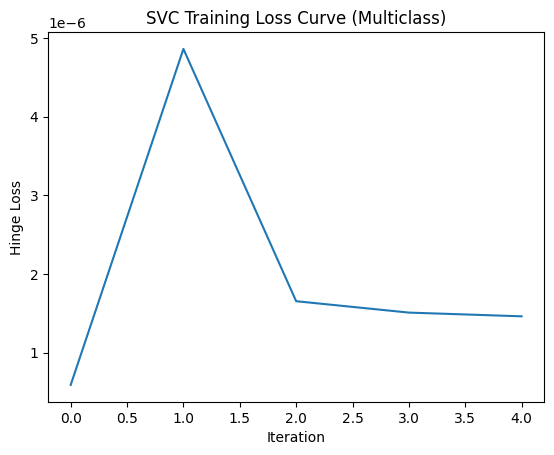

In [15]:
# tracking loss values
svc = SVC(kernel='linear', max_iter=5)
loss_list = []

for i in range(5):
    svc.max_iter = i + 1
    svc.fit(X_train, y_train)

    decision = svc.decision_function(X_train)   # shape = (N, C)
    y_true = y_train

    # correct class score গুলো extract
    correct_scores = decision[np.arange(len(y_true)), y_true]

    # margin calculation: max(0, 1 + other_score - correct_score)
    margins = decision + 1 - correct_scores[:, None]

    # correct class এর নিজের margin বাদ দাও
    margins[np.arange(len(y_true)), y_true] = 0

    # hinge loss = sum positive margins
    hinge = np.maximum(0, margins)
    loss = np.mean(np.sum(hinge, axis=1))

    loss_list.append(loss)

# plot curve
plt.plot(loss_list)
plt.xlabel("Iteration")
plt.ylabel("Hinge Loss")
plt.title("SVC Training Loss Curve (Multiclass)")
plt.savefig("svc_loss_curve.png", dpi=400) 
plt.show()


d:\ML\Comprehensive Health Diagnostics\Comprehensive-Health-Diagnostics\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
d:\ML\Comprehensive Health Diagnostics\Comprehensive-Health-Diagnostics\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=2).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
d:\ML\Comprehensive Health Diagnostics\Comprehensive-Health-Diagnostics\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=3).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
d:\ML\Comprehensive Health Diagnostics\Comprehensive-Health-Diagnostics\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=4).  Consider pre-processing your data wi

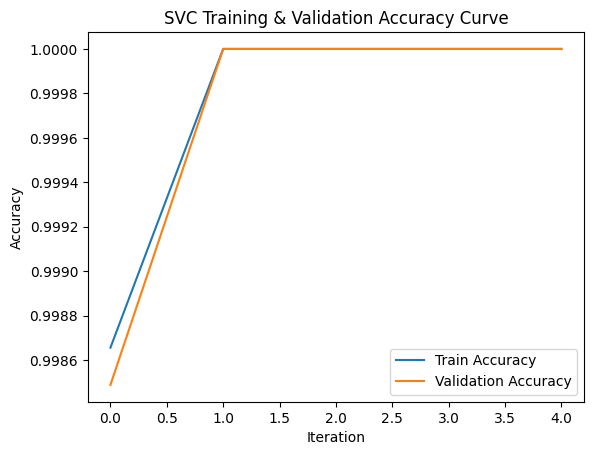

In [16]:
train_acc_list = []
val_acc_list = []

svc = SVC(kernel='linear')

max_iters = 5   # তোমার ইটারেশন সংখ্যা

for i in range(max_iters):
    svc.max_iter = (i+1)
    svc.fit(X_train, y_train)

    # Train accuracy
    y_pred_train = svc.predict(X_train)
    train_acc = accuracy_score(y_train, y_pred_train)
    train_acc_list.append(train_acc)

    # Validation accuracy
    y_pred_val = svc.predict(X_test)
    val_acc = accuracy_score(y_test, y_pred_val)
    val_acc_list.append(val_acc)

# ----------- Plot Accuracy Curve -----------
plt.plot(train_acc_list, label="Train Accuracy")
plt.plot(val_acc_list, label="Validation Accuracy")

plt.xlabel("Iteration")
plt.ylabel("Accuracy")
plt.title("SVC Training & Validation Accuracy Curve")
plt.legend()

plt.savefig("svc_accuracy_curve.png", dpi=300)   # Save graph
plt.show()

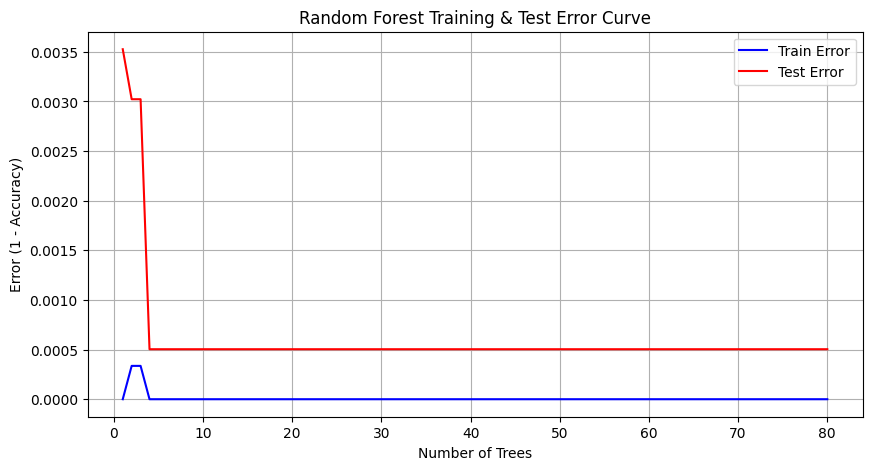

In [17]:
n_estimators = 80
train_error = []
test_error = []

for n in range(1, n_estimators + 1):
    rf = RandomForestClassifier(n_estimators=n, random_state=42)
    rf.fit(X_train, y_train)
    
    train_pred = rf.predict(X_train)
    test_pred = rf.predict(X_test)
    
    # Error = 1 - Accuracy
    train_error.append(1 - accuracy_score(y_train, train_pred))
    test_error.append(1 - accuracy_score(y_test, test_pred))

# Plotting the error curves
plt.figure(figsize=(10,5))
plt.plot(range(1, n_estimators + 1), train_error, label='Train Error', color='blue')
plt.plot(range(1, n_estimators + 1), test_error, label='Test Error', color='red')
plt.xlabel('Number of Trees')
plt.ylabel('Error (1 - Accuracy)')
plt.title('Random Forest Training & Test Error Curve')
plt.legend()
plt.grid(True)
plt.savefig("RandomForest_Training_&_Test_Error_curve.png", dpi=300)   # Save graph
plt.show()

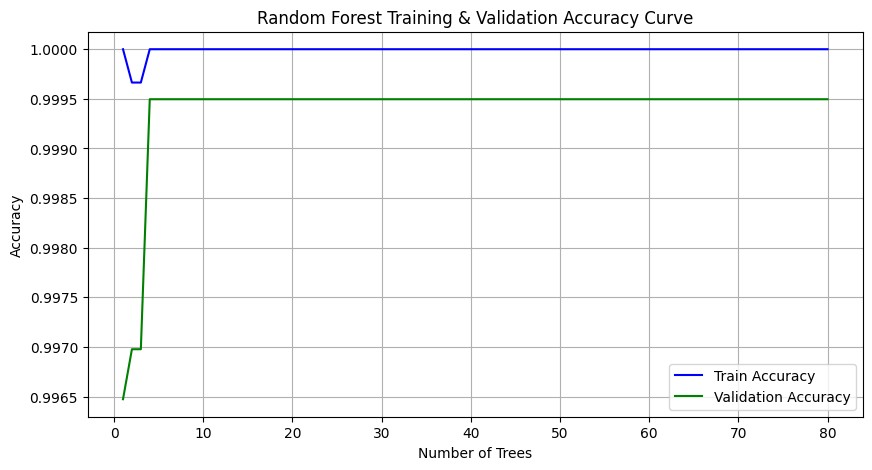

In [18]:
n_estimators = 80
train_acc = []
val_acc = []

for n in range(1, n_estimators + 1):
    rf = RandomForestClassifier(n_estimators=n, random_state=42)
    rf.fit(X_train, y_train)
    
    # Training accuracy
    train_pred = rf.predict(X_train)
    train_acc.append(accuracy_score(y_train, train_pred))
    
    # Validation (Test) accuracy
    val_pred = rf.predict(X_test)
    val_acc.append(accuracy_score(y_test, val_pred))

# Plotting the curves
plt.figure(figsize=(10,5))
plt.plot(range(1, n_estimators + 1), train_acc, label='Train Accuracy', color='blue')
plt.plot(range(1, n_estimators + 1), val_acc, label='Validation Accuracy', color='green')
plt.xlabel('Number of Trees')
plt.ylabel('Accuracy')
plt.title('Random Forest Training & Validation Accuracy Curve')
plt.legend()
plt.grid(True)
plt.savefig("RandomForest_Training_&_Validation_Accuracy_curve.png", dpi=300)   # Save graph
plt.show()

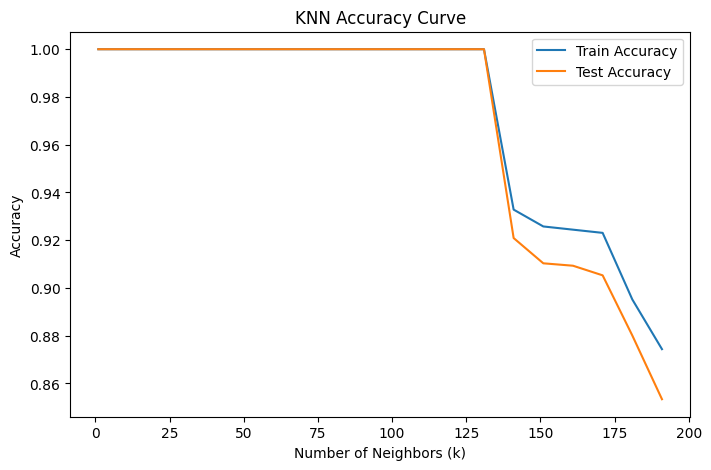

In [19]:
k_values = list(range(1, 201, 10))  # 1 থেকে 200 পর্যন্ত 10 step
train_acc = []
test_acc = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    
    # Train accuracy
    y_train_pred = knn.predict(X_train)
    train_acc.append(accuracy_score(y_train, y_train_pred))
    
    # Test accuracy
    y_test_pred = knn.predict(X_test)
    test_acc.append(accuracy_score(y_test, y_test_pred))

# Plot Accuracy Curve
plt.figure(figsize=(8,5))
plt.plot(k_values, train_acc, label='Train Accuracy')
plt.plot(k_values, test_acc, label='Test Accuracy')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Accuracy')
plt.title('KNN Accuracy Curve')
plt.legend()
plt.savefig("KNN_Accuracy_Curve.png", dpi=300)   # Save graph
plt.show()


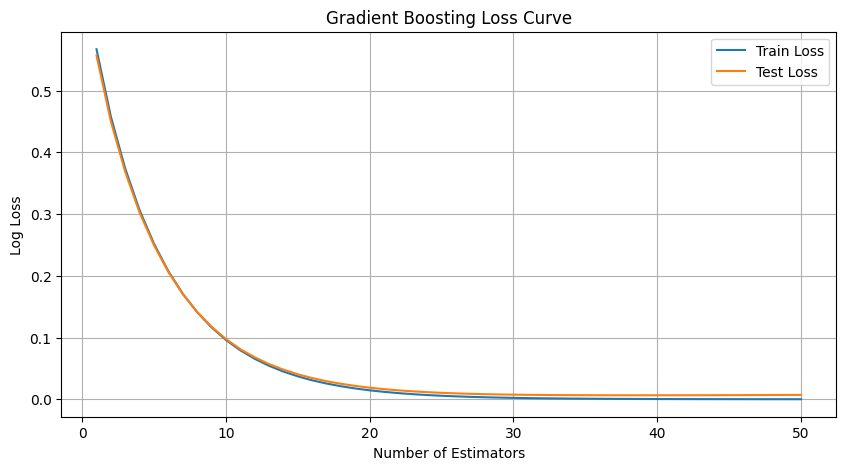

In [20]:

from sklearn.metrics import log_loss, accuracy_score

# Model
GradientBoosting = GradientBoostingClassifier(n_estimators=50)
GradientBoosting.fit(X_train, y_train)

# Accuracy per stage
train_acc = []
test_acc = []
train_loss = []
test_loss = []

for y_train_pred_proba, y_test_pred_proba in zip(
    GradientBoosting.staged_predict_proba(X_train),
    GradientBoosting.staged_predict_proba(X_test)
):
    # Train metrics
    y_train_pred = y_train_pred_proba.argmax(axis=1)
    train_acc.append(accuracy_score(y_train, y_train_pred))
    train_loss.append(log_loss(y_train, y_train_pred_proba))

    # Test metrics
    y_test_pred = y_test_pred_proba.argmax(axis=1)
    test_acc.append(accuracy_score(y_test, y_test_pred))
    test_loss.append(log_loss(y_test, y_test_pred_proba))

# Plot Loss Curve
plt.figure(figsize=(10,5))
plt.plot(range(1, GradientBoosting.n_estimators+1), train_loss, label='Train Loss')
plt.plot(range(1, GradientBoosting.n_estimators+1), test_loss, label='Test Loss')
plt.xlabel('Number of Estimators')
plt.ylabel('Log Loss')
plt.title('Gradient Boosting Loss Curve')
plt.legend()
plt.savefig("Gradient_Boosting_Loss_Curve.png", dpi=300)   # Save graph
plt.grid(True)
plt.show()



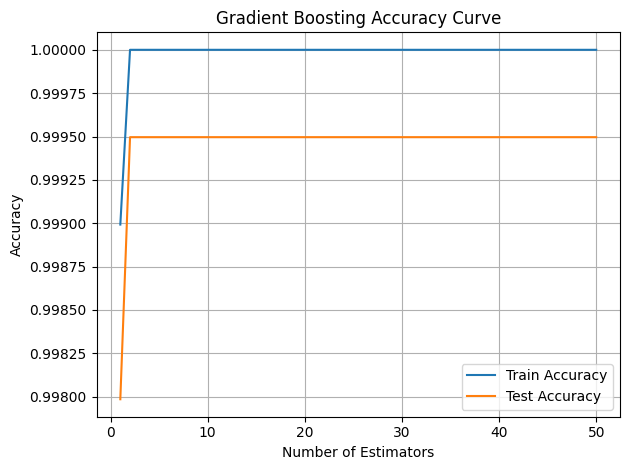

In [21]:
# Plot Accuracy Curve
plt.plot(range(1, GradientBoosting.n_estimators+1), train_acc, label='Train Accuracy')
plt.plot(range(1, GradientBoosting.n_estimators+1), test_acc, label='Test Accuracy')
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')
plt.title('Gradient Boosting Accuracy Curve')
plt.legend()
plt.tight_layout()
plt.savefig("Gradient_Boosting_Accuracy_Curve.png", dpi=300)   # Save graph
plt.grid(True)
plt.show()


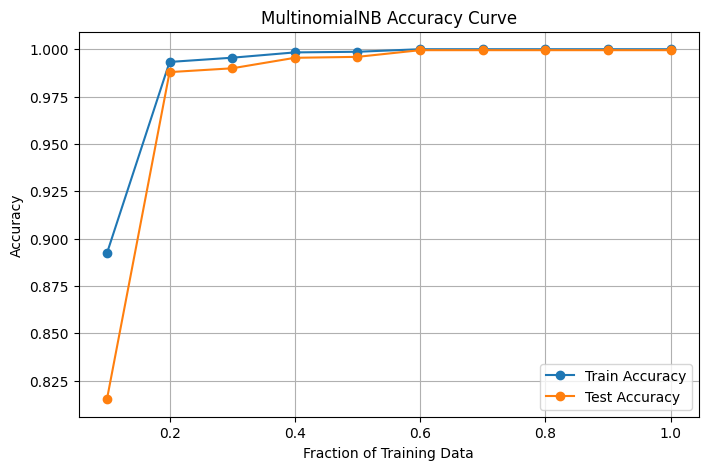

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score

fractions = np.linspace(0.1, 1.0, 10)
train_acc = []
test_acc = []

n_samples = X_train.shape[0]

for frac in fractions:
    end_idx = int(n_samples * frac)
    X_sub = X_train[:end_idx]
    y_sub = y_train[:end_idx]
    
    model = MultinomialNB(alpha=5.0)
    model.fit(X_sub, y_sub)
    
    # Train accuracy
    y_train_pred = model.predict(X_sub)
    train_acc.append(accuracy_score(y_sub, y_train_pred))
    
    # Test accuracy
    y_test_pred = model.predict(X_test)
    test_acc.append(accuracy_score(y_test, y_test_pred))

# Plot Accuracy Curve
plt.figure(figsize=(8,5))
plt.plot(fractions, train_acc, label='Train Accuracy', marker='o')
plt.plot(fractions, test_acc, label='Test Accuracy', marker='o')
plt.xlabel('Fraction of Training Data')
plt.ylabel('Accuracy')
plt.title('MultinomialNB Accuracy Curve')
plt.legend()
plt.savefig("MultinomialNB_Accuracy_Curve.png", dpi=300)   # Save graph
plt.grid(True)
plt.show()


d:\ML\Comprehensive Health Diagnostics\Comprehensive-Health-Diagnostics\lib\site-packages\xgboost\core.py:158: UserWarning: [15:03:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


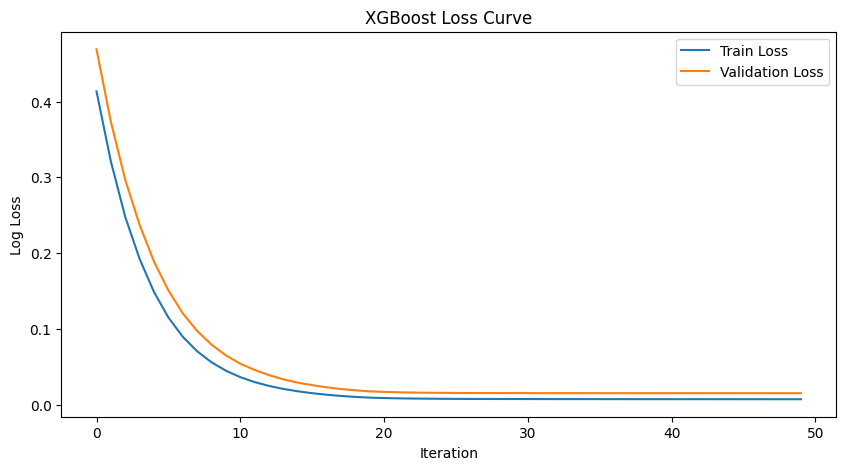

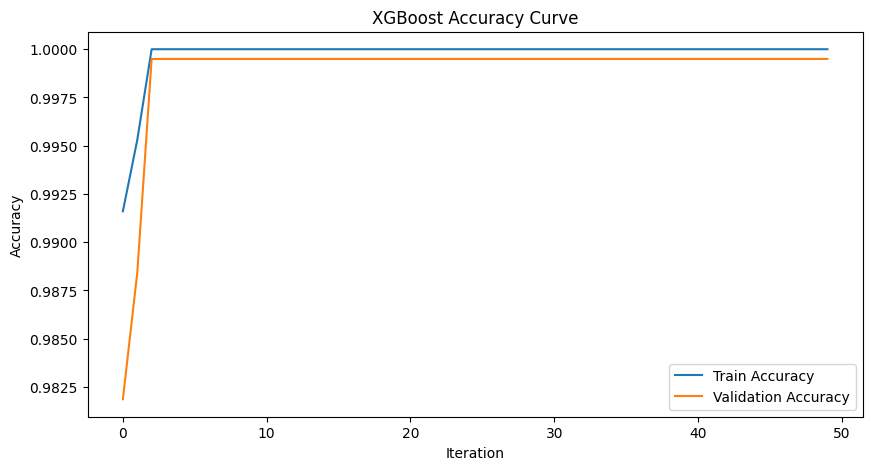

In [23]:
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, log_loss
import matplotlib.pyplot as plt

# --- Label encode ---
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_test_enc  = le.transform(y_test)

# --- Model ---
model = XGBClassifier(n_estimators=50, use_label_encoder=False, eval_metric='logloss')

# --- Fit model ---
model.fit(X_train, y_train_enc, verbose=False)

# --- Loss & Accuracy Curve ---
train_loss, val_loss = [], []
train_acc, val_acc = [], []

for i in range(1, model.n_estimators + 1):
    # Probabilities for loss
    y_train_proba = model.predict_proba(X_train, iteration_range=(0,i))
    y_val_proba   = model.predict_proba(X_test, iteration_range=(0,i))
    train_loss.append(log_loss(y_train_enc, y_train_proba))
    val_loss.append(log_loss(y_test_enc, y_val_proba))
    
    # Predictions for accuracy
    y_train_pred = model.predict(X_train, iteration_range=(0,i))
    y_val_pred   = model.predict(X_test, iteration_range=(0,i))
    train_acc.append(accuracy_score(y_train_enc, y_train_pred))
    val_acc.append(accuracy_score(y_test_enc, y_val_pred))

# --- Plot Loss ---
plt.figure(figsize=(10,5))
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Iteration')
plt.ylabel('Log Loss')
plt.title('XGBoost Loss Curve')
plt.legend()
plt.savefig("XGBoost_Loss_Curve.png", dpi=300)   # Save graph
plt.show()

# --- Plot Accuracy ---
plt.figure(figsize=(10,5))
plt.plot(train_acc, label='Train Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.xlabel('Iteration')
plt.ylabel('Accuracy')
plt.title('XGBoost Accuracy Curve')
plt.legend()
plt.savefig("XGBoost_Accuracy_Curve.png", dpi=300)   # Save graph
plt.show()


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 46
[LightGBM] [Info] Number of data points in the train set: 238, number of used features: 23
[LightGBM] [Info] Start training from score -3.392829
[LightGBM] [Info] Start training from score -3.680511
[LightGBM] [Info] Start training from score -4.085976
[LightGBM] [Info] Start training from score -3.392829
[LightGBM] [Info] Start training from score -3.680511
[LightGBM] [Info] Start training from score -4.779123
[LightGBM] [Info] Start training from score -4.085976
[LightGBM] [Info] Start training from score -3.169686
[LightGBM] [Info] Start training from score -3.862833
[LightGBM] [Info] Start training from score -3.392829
[LightGBM] [Info] Start trainin

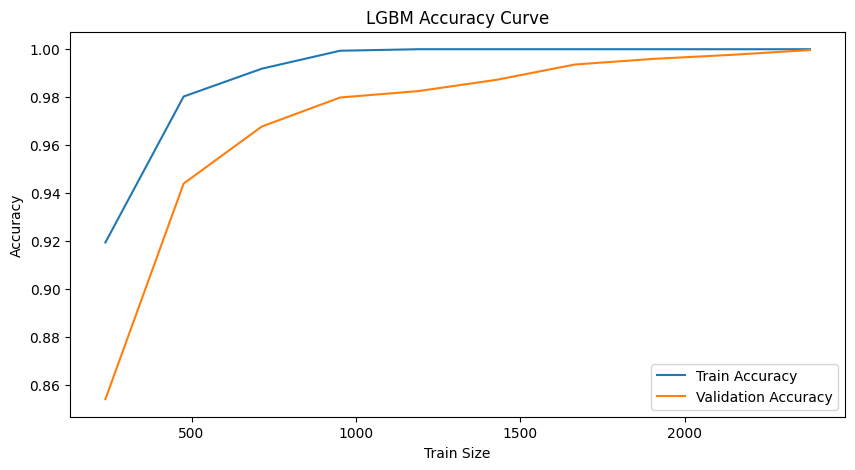

In [24]:
from lightgbm import LGBMClassifier
from sklearn.model_selection import learning_curve
import numpy as np
import matplotlib.pyplot as plt

model = LGBMClassifier()

train_sizes, train_acc, val_acc = learning_curve(
    estimator=model,
    X=X_train,
    y=y_train,
    cv=5,
    scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# Mean accuracy
train_acc_mean = train_acc.mean(axis=1)
val_acc_mean = val_acc.mean(axis=1)

plt.figure(figsize=(10,5))
plt.plot(train_sizes, train_acc_mean, label="Train Accuracy")
plt.plot(train_sizes, val_acc_mean, label="Validation Accuracy")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.title("LGBM Accuracy Curve")
plt.legend()
plt.savefig("LGBM_Accuracy_Curve.png", dpi=300)   # Save graph
plt.show()


d:\ML\Comprehensive Health Diagnostics\Comprehensive-Health-Diagnostics\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
d:\ML\Comprehensive Health Diagnostics\Comprehensive-Health-Diagnostics\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
d:\ML\Comprehensive Health Diagnostics\Comprehensive-Health-Diagnostics\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
d:\ML\Comprehensive Health Diagnostics\Comprehensive-Health-Diagnostics\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
d:\ML\Comprehensive Health Diagnostics\Comprehensive-Health-Diagnostics\lib\site-packages\sklearn\li

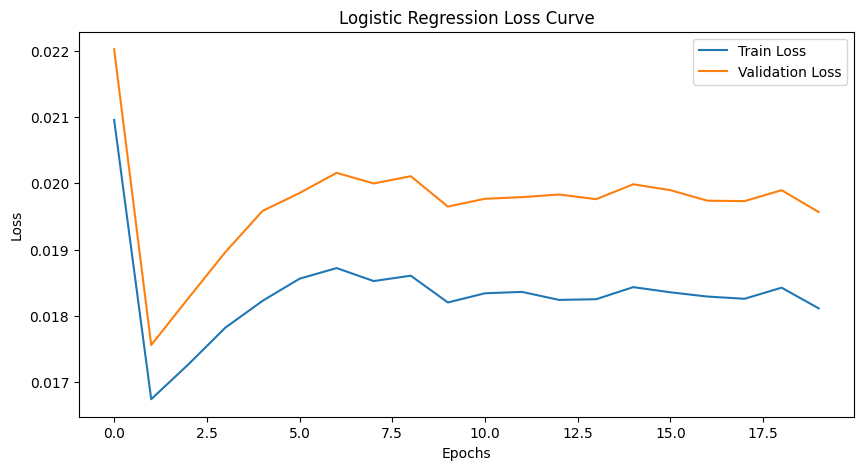

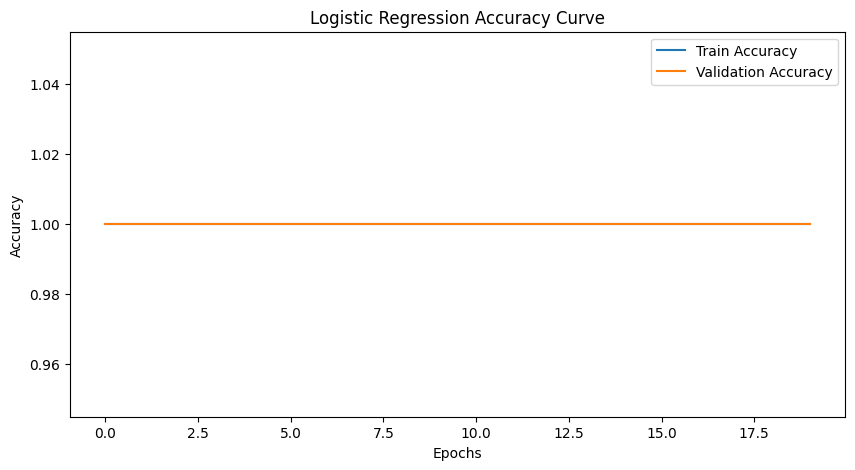

In [25]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss, accuracy_score
import numpy as np
import matplotlib.pyplot as plt

# Model (saga solver supports warm_start)
model = LogisticRegression(max_iter=1, solver='saga', warm_start=True)

epochs = 20
train_loss = []
train_acc = []
val_loss = []
val_acc = []

for i in range(epochs):
    model.fit(X_train, y_train)

    # ---- Training Predictions ----
    y_train_pred = model.predict(X_train)
    y_train_proba = model.predict_proba(X_train)
    train_acc.append(accuracy_score(y_train, y_train_pred))
    train_loss.append(log_loss(y_train, y_train_proba))
    
    # ---- Validation Predictions ----
    y_val_pred = model.predict(X_test)
    y_val_proba = model.predict_proba(X_test)
    val_acc.append(accuracy_score(y_test, y_val_pred))
    val_loss.append(log_loss(y_test, y_val_proba))


# ===== Plot Loss Curve =====
plt.figure(figsize=(10,5))
plt.plot(train_loss, label="Train Loss")
plt.plot(val_loss, label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Logistic Regression Loss Curve")
plt.legend()
plt.savefig("Logistic_Regression_Loss_Curve.png", dpi=300)   # Save graph
plt.show()

# ===== Plot Accuracy Curve =====
plt.figure(figsize=(10,5))
plt.plot(train_acc, label="Train Accuracy")
plt.plot(val_acc, label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Logistic Regression Accuracy Curve")
plt.legend()
plt.savefig("Logistic_Regression_Accuracy_Curve.png", dpi=300)   # Save graph
plt.show()


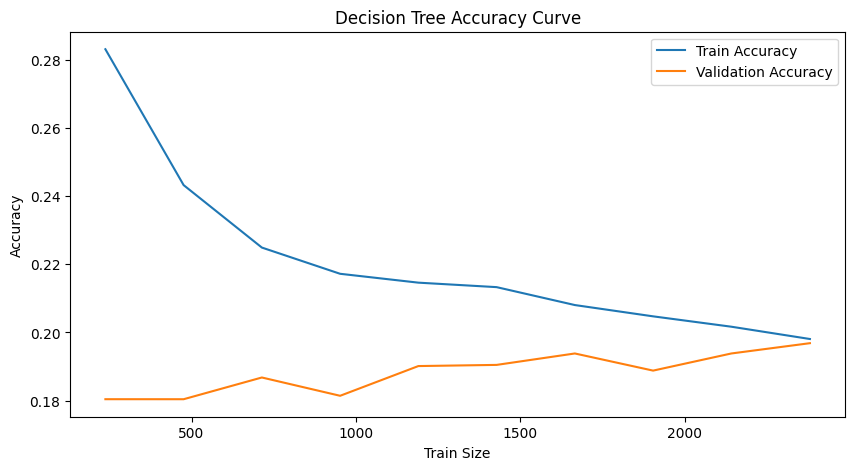

In [26]:
from sklearn.model_selection import learning_curve

model = DecisionTreeClassifier(criterion='entropy', max_depth=3)

train_sizes, train_acc, val_acc = learning_curve(
    model,
    X_train,
    y_train,
    cv=5,
    scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# Mean accuracy
train_acc_mean = train_acc.mean(axis=1)
val_acc_mean = val_acc.mean(axis=1)

plt.figure(figsize=(10,5))
plt.plot(train_sizes, train_acc_mean, label="Train Accuracy")
plt.plot(train_sizes, val_acc_mean, label="Validation Accuracy")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.title("Decision Tree Accuracy Curve")
plt.legend()
plt.savefig("Decision_Tree_Accuracy_Curve.png", dpi=300)   # Save graph
plt.show()
